# Imports #

In [1]:
%%time

# Import libraries and show its versions
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"
#os.environ["CUDA_LAUNCH_BLOCKING"]="1"
import sys
import pathlib
from pathlib import Path
import glob
from glob import glob
import math
from math import sqrt, log, prod
import collections
from collections import OrderedDict
import pickle
from pickle import dump
import datetime
from datetime import datetime, timedelta
import warnings

try:
    import numpy as np; print('NumPy version: ', np.__version__)
    from numpy import array, asarray, delete, append, concatenate
except:
    !{sys.executable} -m pip install numpy==1.19.5
    import numpy as np; print('NumPy version: ', np.__version__)
    from numpy import array, asarray, delete, append, concatenate

try:
    import pandas as pd; print('Pandas version: ', pd.__version__)
    from pandas import read_csv, DataFrame, concat
except:
    !{sys.executable} -m pip install pandas
    import pandas as pd; print('Pandas version: ', pd.__version__)
    from pandas import read_csv, DataFrame, concat
    
try:
    import matplotlib as mpl; print('MatPlotLib version: ', mpl.__version__)
    from matplotlib import pyplot as plt
    from matplotlib import dates as md
except:
    !{sys.executable} -m pip install matplotlib
    import matplotlib as mpl; print('MatPlotLib version: ', mpl.__version__)
    from matplotlib import pyplot as plt
    from matplotlib import dates as md
    
try:
    import tensorflow as tf; print('TensorFlow version: ', tf.__version__)
    import tensorflow.keras as keras; print('Keras version: ', keras.__version__)
    from tensorflow.keras import backend as K
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import TimeDistributed, Conv1D, MaxPooling1D, Flatten, LSTM, Dense
    from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau
except:
    !{sys.executable} -m pip install tensorflow
    import tensorflow as tf; print('TensorFlow version: ', tf.__version__)
    import tensorflow.keras as keras; print('Keras version: ', keras.__version__)
    from tensorflow.keras import backend as K
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import TimeDistributed, Conv1D, MaxPooling1D, Flatten, LSTM, Dense
    from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau

try:
    import torch as torch; print('Torch version: ', torch.__version__)
except:
    !{sys.executable} -m pip install torch
    import torch as torch; print('Torch version: ', torch.__version__)

try:
    import gretel_synthetics as gs
    from gretel_synthetics.timeseries_dgan.dgan import DGAN
    from gretel_synthetics.timeseries_dgan.config import DGANConfig, OutputType
except:
    !{sys.executable} -m pip install git+https://github.com/gretelai/gretel-synthetics.git
    import gretel_synthetics as gs
    from gretel_synthetics.timeseries_dgan.dgan import DGAN
    from gretel_synthetics.timeseries_dgan.config import DGANConfig, OutputType

# Configurations
np.set_printoptions(linewidth=1000)
#pd.set_option('display.max_columns', None)
torch.set_num_threads(60)
#warnings.filterwarnings('ignore')

print()

NumPy version:  1.22.4
Pandas version:  1.5.3
MatPlotLib version:  3.8.2


2024-04-18 15:08:49.031856: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-18 15:08:49.164716: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-18 15:08:49.771061: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/local/cuda-11.8/lib64:/usr/local/CUDNN-8.9.6-cuda11/lib:/home/jmorales/venv/lib64

TensorFlow version:  2.11.0
Keras version:  2.11.0
Torch version:  2.0.0+cu117

CPU times: user 6.79 s, sys: 6.42 s, total: 13.2 s
Wall time: 3.73 s


# Define functions #

In [2]:
%%time

# Date parser
def custom_date_parser(date):
    try:
        return pd.to_datetime(date, format='%Y-%m-%d %H:%M:%S')
    except ValueError:
        return pd.to_datetime(date, format='%d/%m/%Y %H:%M')

# Iterate each hour between two dates
def hourly_it(start, finish):
    while finish > start:
        start = start + timedelta(hours=1)
        yield start

# Show a few of the 1-day training samples
def plot_day(f, k):
    xaxis_1day = datasets[k].index[0:f.shape[0]]

    for i, c in enumerate(datasets[k].columns):
        plt.plot(xaxis_1day, f[:,i], label=c)
    ax = plt.gca()
    ax.xaxis.set_major_locator(md.HourLocator(byhour=range(2,24,3)))
    ax.xaxis.set_major_formatter(md.DateFormatter("%H:%M"))
    plt.legend()
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.show()

print()


CPU times: user 23 µs, sys: 20 µs, total: 43 µs
Wall time: 52.2 µs


# Define parameters #

In [3]:
%%time

# Global variables
number_of_years_to_forecast = 10
multivariate_variables = {
    '60_BILBAO': [
        'Benceno',
        'CO',
        'CO 8h',
        'Etilbenceno',
        'NO',
        'NO2',
        'NOX',
        'O3',
        'O3 8h',
        'Ortoxileno',
        'PM10',
        'PM2.5',
        'SO2',
        'Tolueno',
        'DirecWind',
        'Humid',
        'Precip',
        'Temp',
        'SpeedWind',
        'Car',
        'Motorcycle',
        'Bus',
        'Truck'
    ],
    '60_MADRID': [
        'CO',
        'O3',
        'PM10',
        'PM2.5',
        'SO2',
        'SpeedWind',
        'DirecWind',
        'Temp',
        'Humid',
        'Precip',
        'Car',
        'Motorcycle',
        'Bus',
        'Truck'
    ]
}

# Dataset variables
datasets = {}
look_back = {
    '60_BILBAO': 24 * 1,
    '60_MADRID': 24 * 1,
}
features_output_type = {
    '60_BILBAO': [
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.DISCRETE,
        OutputType.DISCRETE,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.DISCRETE,
        OutputType.DISCRETE,
        OutputType.DISCRETE,
        OutputType.DISCRETE
    ],
    '60_MADRID': [
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.CONTINUOUS,
        OutputType.DISCRETE,
        OutputType.CONTINUOUS,
        OutputType.DISCRETE,
        OutputType.CONTINUOUS,
        OutputType.DISCRETE,
        OutputType.DISCRETE,
        OutputType.DISCRETE,
        OutputType.DISCRETE
    ]
}
synth_datasets = {}

print()


CPU times: user 44 µs, sys: 39 µs, total: 83 µs
Wall time: 163 µs


# Read datasets #

In [4]:
%%time

# Iterate over all possible train datasets
for file in glob('./datasets/*.csv'):
    
    # Print a header
    print('-' * 37, Path(file).stem.upper(), '-' * 37)
    
    # Read a dataset
    datasets[Path(file).stem] = read_csv(file, parse_dates={'Fecha_Hora': ['Fecha', 'Hora']}, date_parser=custom_date_parser, index_col='Fecha_Hora')
    
    # Select variables
    datasets[Path(file).stem] = datasets[Path(file).stem][multivariate_variables[Path(file).stem.upper()]]

    # Iterpolate datasets
    datasets[Path(file).stem] = datasets[Path(file).stem].interpolate('linear')
    
    """
    # Plot the 4 columns over the 4+ months of data
    for c in datasets[Path(file).stem].columns:
        plt.plot(datasets[Path(file).stem].index, datasets[Path(file).stem][c], label=c)
    plt.xticks(rotation=90)
    plt.legend()
    plt.ylabel("Temperature (Celsius)")
    plt.xlabel("Date")
    plt.show()
    """
    
    # Print dataset info
    print(datasets[Path(file).stem].info())

# Order datasets
key_order = {k:v for v,k in enumerate([
    '60_BILBAO',
    '60_MADRID',
])}
ordered_dict = OrderedDict(sorted(datasets.items(), key=lambda i:key_order.get(i[0])))
datasets = ordered_dict

print()

------------------------------------- 60_MADRID -------------------------------------
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 421 entries, 2023-09-13 11:00:00 to 2023-09-30 23:00:00
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   CO          421 non-null    float64
 1   O3          421 non-null    float64
 2   PM10        421 non-null    float64
 3   PM2.5       421 non-null    float64
 4   SO2         421 non-null    float64
 5   SpeedWind   421 non-null    float64
 6   DirecWind   421 non-null    int64  
 7   Temp        421 non-null    float64
 8   Humid       421 non-null    int64  
 9   Precip      421 non-null    float64
 10  Car         421 non-null    int64  
 11  Motorcycle  421 non-null    int64  
 12  Bus         421 non-null    int64  
 13  Truck       421 non-null    int64  
dtypes: float64(8), int64(6)
memory usage: 49.3 KB
None
------------------------------------- 60_BILBAO ------------

# Synthetic data generation model #

In [5]:
%%time

# Iterate over all possible train datasets
for key, dataset in datasets.items():
    
    # Print a header
    print('-' * 37, key.upper(), '-' * 37)
    
    # DGAN needs many example time series to train. Split into 1-day slices to create multiple examples.
    features = dataset.to_numpy()
    # Obsevations every 10 minutes, so 144 * 10 minutes = 1 day
    n = features.shape[0] // look_back[key]
    features = features[:(n*look_back[key]),:].reshape(-1, look_back[key], features.shape[1])
    # Plot 1-day real data
    print('Real data')
    #plot_day(features[125,:,:], key)
    #plot_day(features[3,:,:], key)
    #plot_day(features[21,:,:], key)
    # Shape is now (# examples, # time points, # features)
    print(f'Features shape: {features.shape}')
    
    # Create DGAN model
    model = DGAN(DGANConfig(
        max_sequence_len=features.shape[1],
        sample_len=look_back[key],
        batch_size=min(3*365, features.shape[0]),
        apply_feature_scaling=True,
        apply_example_scaling=False,
        use_attribute_discriminator=False,
        generator_learning_rate=1e-4,
        discriminator_learning_rate=1e-4,
        epochs=100000,
    ))
    
    # Train DGAN model
    model.train_numpy(
        features,
        feature_types=features_output_type[key],
    )

    # Generate synthetic data
    _, synthetic_features = model.generate_numpy(365*number_of_years_to_forecast)
    # Plot 1-day synthetic data
    print('Synthetic data')
    #plot_day(synthetic_features[825,:,:], key)
    #plot_day(synthetic_features[42,:,:], key)
    #plot_day(synthetic_features[496,:,:], key)
    # Shape is now (# examples, # time points, # features)
    print(f'Synth data shape: {synthetic_features.shape}')
    synthetic_df = pd.DataFrame(synthetic_features.reshape(-1, synthetic_features.shape[2]), columns=dataset.columns)
    synth_datasets[key] = synthetic_df

    # Set minimum value to zero
    synth_datasets[key] = synth_datasets[key].clip(lower=0)
        
    # Check and create a directory if not exists
    Path('./out/').mkdir(parents = True, exist_ok = True)

    # Store the data
    synthetic_df.to_csv(f'./out/{key}_synth.csv', sep=';', index=True, decimal='.')

print()

------------------------------------- 60_BILBAO -------------------------------------
Real data
Features shape: (14, 24, 23)


/home/jmorales/venv_dgan/lib/python3.9/site-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version. Use is_categorical_dtype instead.
  elif pd.api.types.is_categorical(cols):
/home/jmorales/venv_dgan/lib/python3.9/site-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version. Use is_categorical_dtype instead.
  elif pd.api.types.is_categorical(cols):
/home/jmorales/venv_dgan/lib/python3.9/site-packages/category_encoders/one_hot.py:187: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for cat_name, class_ in values.iteritems():
/home/jmorales/venv_dgan/lib/python3.9/site-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version. Use is_categorical_dtype instead.
  elif pd.api.types.is_categorical(cols):
/home/jmorales/venv_dgan/lib/pyt

Synthetic data
Synth data shape: (3650, 24, 23)
------------------------------------- 60_MADRID -------------------------------------
Real data
Features shape: (17, 24, 14)


/home/jmorales/venv_dgan/lib/python3.9/site-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version. Use is_categorical_dtype instead.
  elif pd.api.types.is_categorical(cols):
/home/jmorales/venv_dgan/lib/python3.9/site-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version. Use is_categorical_dtype instead.
  elif pd.api.types.is_categorical(cols):
/home/jmorales/venv_dgan/lib/python3.9/site-packages/category_encoders/one_hot.py:187: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for cat_name, class_ in values.iteritems():
/home/jmorales/venv_dgan/lib/python3.9/site-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version. Use is_categorical_dtype instead.
  elif pd.api.types.is_categorical(cols):
/home/jmorales/venv_dgan/lib/pyt

Synthetic data
Synth data shape: (3650, 24, 14)

CPU times: user 12h 13s, sys: 14min 7s, total: 12h 14min 21s
Wall time: 12h 32min 17s


# Compare Real-Synth results #

------------------------------------- 60_BILBAO -------------------------------------
Correlation in real data:
              Benceno        CO     CO 8h  Etilbenceno        NO       NO2  \
Benceno      1.000000  0.621789  0.482796     0.740376  0.547685  0.674036   
CO           0.621789  1.000000  0.699145     0.658267  0.621467  0.755273   
CO 8h        0.482796  0.699145  1.000000     0.681669  0.448221  0.457879   
Etilbenceno  0.740376  0.658267  0.681669     1.000000  0.608817  0.627966   
NO           0.547685  0.621467  0.448221     0.608817  1.000000  0.534552   
NO2          0.674036  0.755273  0.457879     0.627966  0.534552  1.000000   
NOX          0.669193  0.754698  0.508832     0.694210  0.940507  0.789746   
O3          -0.474370 -0.629627 -0.338332    -0.447492 -0.500084 -0.714816   
O3 8h       -0.404532 -0.425925 -0.613558    -0.559181 -0.625479 -0.391004   
Ortoxileno   0.747806  0.686921  0.692796     0.982072  0.627534  0.667121   
PM10         0.639335  0.75591

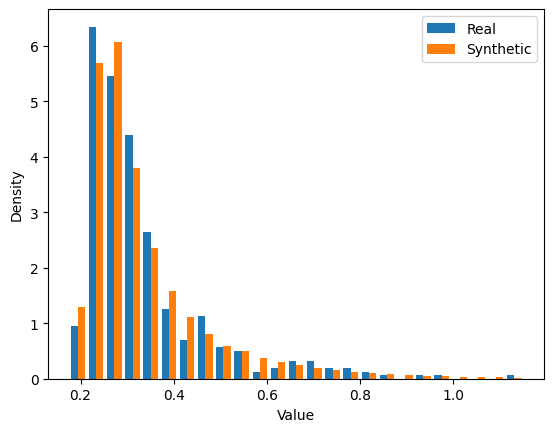

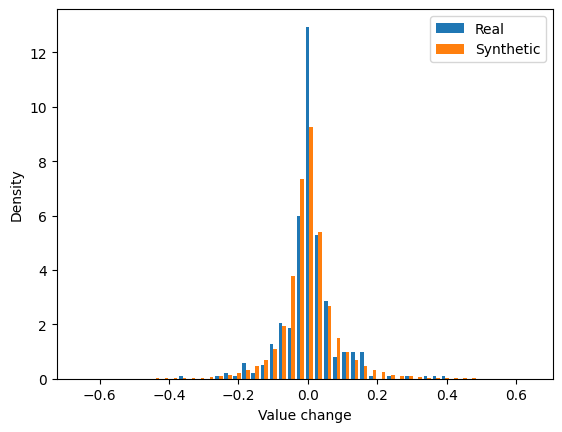

------------------------------------- 60_MADRID -------------------------------------
Correlation in real data:
                  CO        O3      PM10     PM2.5       SO2  SpeedWind  \
CO          1.000000 -0.500457  0.600328  0.570307  0.325951  -0.378545   
O3         -0.500457  1.000000 -0.181750 -0.215614 -0.271701   0.462449   
PM10        0.600328 -0.181750  1.000000  0.932306  0.239742  -0.261554   
PM2.5       0.570307 -0.215614  0.932306  1.000000  0.164666  -0.275056   
SO2         0.325951 -0.271701  0.239742  0.164666  1.000000  -0.175252   
SpeedWind  -0.378545  0.462449 -0.261554 -0.275056 -0.175252   1.000000   
DirecWind  -0.031790  0.174563 -0.239900 -0.284605 -0.132047   0.516446   
Temp       -0.003006  0.745643  0.341515  0.258180 -0.097860   0.126652   
Humid      -0.095528 -0.647033 -0.245240 -0.156555  0.041842  -0.105765   
Precip     -0.074677  0.045415 -0.015436  0.029657 -0.042872   0.120086   
Car         0.079084  0.348905  0.232902  0.104833  0.111184   

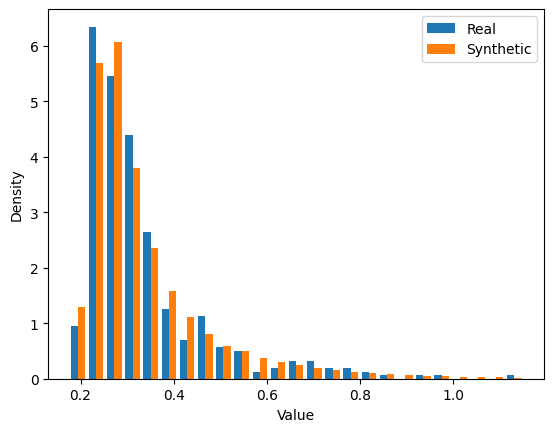

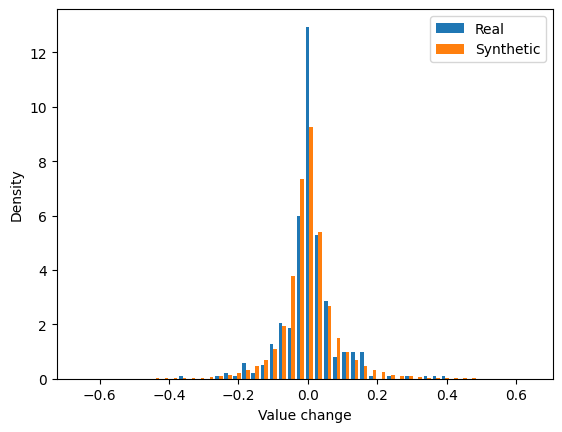


CPU times: user 2.29 s, sys: 3.45 s, total: 5.73 s
Wall time: 1.34 s


In [6]:
%%time

# Iterate over all possible train datasets
for key, dataset in datasets.items():
    
    # Print a header
    print('-' * 37, key.upper(), '-' * 37)

    # Compare (non-temporal) correlations between the 4 temperatures
    print("Correlation in real data:")
    print(datasets[key].corr())
    print()
    print("Correlation in synthetic data:")
    print(synth_datasets[key].corr())
    print()
    
    # Compare distribution of T_out values
    plt.hist([features[:,:,0].flatten(), synthetic_features[:,:,0].flatten()], 
             label=["Real", "Synthetic"],
             bins=25,
             density=True)
    plt.legend()
    plt.xlabel("Value")
    plt.ylabel("Density")
    plt.show()
    
    # Compare distribution of 1-step (10 minute) diffs for T_out
    real_diffs = np.diff(features, axis=1)
    synthetic_diffs = np.diff(synthetic_features, axis=1)

    plt.hist([real_diffs[:,:,0].flatten(), synthetic_diffs[:,:,0].flatten()],
             label=["Real", "Synthetic"],
             bins=50,
             density=True)
    plt.legend()
    plt.xlabel("Value change")
    plt.ylabel("Density")
    plt.show()
    # 1-step diffs for synthetic data have higher variance, this aligns with the increased noise visible in the plots

print()